In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
import numpy as np
import pandas as pd
import pickle

from spike_and_slab_ser import SpikeSlabSER

### Real eQTL example

Now we show a quick run through a real eQTL exaple

In [464]:
def data2():
    """
    zscore path: path to directory with zcore files [gene].zscore_matrix.txt'
    ld_path: path to directory with emprical correlation matrices of snps [gene]
    afreq_path: path to directory with allele frequency files, organized by chromasome
    """
    
    ld_path = '/Users/karltayeb/Research/gp_fine_mapping/data/{}/'.format(gene)
    zscore_path = '../data/zscore_genes_for_Karl/'
    afreq_path = '../data/afreq/'
    
    if zscore_path[-1] == '/':
        zscore_path = zscore_path[:-1]
    if ld_path[-1] == '/':
        ld_path = ld_path[:-1]
    if afreq_path[-1] == '/':
        afreq_path = afreq_path[:-1]

    X = pd.read_csv('{}/{}.ld'.format(ld_path, gene), index_col=0)
    zscores = pd.read_csv('{}/{}.zscore_matrix.txt'.format(zscore_path, gene), '\t', index_col=0)

    nan_snps = np.all(np.isnan(X.values), axis=1)
    X = X.iloc[~nan_snps].iloc[:, ~nan_snps]

    active_snps = np.isin(X.index, zscores.index)
    X = X.iloc[active_snps].iloc[:, active_snps]

    active_snps = np.isin(zscores.index, X.index)
    Y = zscores.iloc[active_snps]
    Y = Y.iloc[:, ~np.any(np.isnan(Y.values), 0)]

    tissues = Y.columns.values
    snp_ids = Y.index.values
    pos = np.array([int(snp_id.split('_')[1]) for snp_id in snp_ids])

    Y = Y.T.values
    X = X.values
    X = (X + np.eye(X.shape[0])*1e-6) / (1+1e-6)

    # flip sign of zscore if alternate allele is major
    chrom = snp_ids[0].split('_')[0][3:]
    afreq = pd.read_csv('{}/chrom{}.afreq'.format(afreq_path, chrom))

    sign = np.ones(snp_ids.size)
    sign[afreq.set_index('ID').loc[snp_ids].ALT_FREQS > 0.5] = -1
    #Y = Y * sign
    #X = X * np.outer(sign, sign)

    return X, Y, snp_ids, tissues

In [393]:
gene = 'ENSG00000073464.11'
#gene = 'ENSG00000141644.17'
#gene = 'ENSG00000164904.17'

In [465]:
def data1():
    ld_path = '/Users/karltayeb/Research/gp_fine_mapping/data/{}/'.format(gene)
    zscore_path = '../data/zscore_genes_for_Karl/'
    afreq_path = '../data/afreq/'

    if zscore_path[-1] == '/':
        zscore_path = zscore_path[:-1]
    if ld_path[-1] == '/':
        ld_path = ld_path[:-1]
    if afreq_path[-1] == '/':
        afreq_path = afreq_path[:-1]

    X = pd.read_csv('{}/{}.ld'.format(ld_path, gene), header=None, sep='\t')
    zscores = pd.read_csv('{}/{}.zscore_matrix.txt'.format(zscore_path, gene), '\t', index_col=0)

    X.index = zscores.index

    tissues = zscores.columns.values
    snp_ids = zscores.index.values

    chrom = snp_ids[0].split('_')[0][3:]
    afreq = pd.read_csv('{}/chrom{}.afreq'.format(afreq_path, chrom))

    filter1 = np.all(np.isnan(X.values), 0)
    filter2 = np.any(np.isnan(zscores.values), 1)
    filter3 = afreq.set_index('ID').loc[snp_ids].ALT_FREQS.values > 0.05
    filter4 = afreq.set_index('ID').loc[snp_ids].ALT_FREQS.values < 0.95

    f = ~filter1 * ~filter2 * filter3 * filter4

    Y = zscores.iloc[f, :]
    X = X.iloc[f, f]
    snp_ids = snp_ids[f]

    # put in terms of minor allele
    sign = np.ones(snp_ids.size)
    #sign[afreq.set_index('ID').loc[snp_ids].ALT_FREQS > 0.5] = -1
    #Y[:, :] = (Y.values * sign[:, None])
    #X[:, :] = X.values * np.outer(sign, sign)
    return X, Y, snp_ids, tissues

In [466]:
X1, Y1, snp_ids1, tissues1 = data1()

In [467]:
X2, Y2, snp_ids2, tissues2 = data2()

IndexError: index 0 is out of bounds for axis 0 with size 0

In [340]:
X_tissue = []
for tissue in tissues:
    Xt = pd.read_csv('{}/{}_{}.ld'.format(ld_path, gene, tissue), header=None, sep='\t')
    X_tissue.append(Xt.iloc[f, f].values * np.outer(sign, sign))
X_tissue = np.stack(X_tissue)

In [450]:
%%time
K = 5
prior_activity = np.exp(-1*np.linspace(1, 1, K))
global_model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 20.0)
global_model.forward_fit(verbose=True, early_stop=True)

Forward fit, learning 1 components
Parameters converged at iter 3
Parameters converged at iter 0
Forward fit, learning 2 components
Parameters converged at iter 10
Parameters converged at iter 84
Forward fit, learning 3 components
Parameters converged at iter 2
Parameters converged at iter 63
Forward fit, learning 4 components
Parameters converged at iter 3
Parameters converged at iter 79
Forward fit, learning 5 components
Parameters converged at iter 2
Parameters converged at iter 84
CPU times: user 22.4 s, sys: 42.9 ms, total: 22.4 s
Wall time: 5.62 s


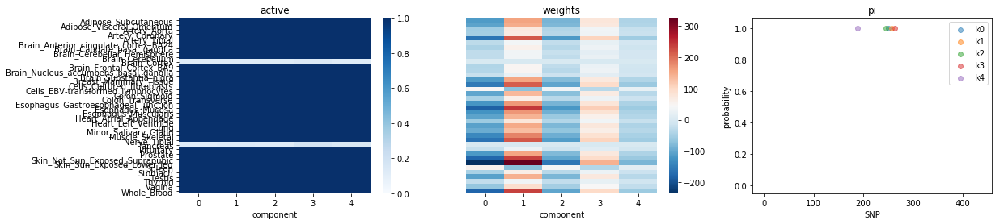

In [451]:
global_model.plot_components()

In [347]:
def get_inputs(zscore_path, ld_path, afreq_path, gene):
    """
    zscore path: path to directory with zcore files [gene].zscore_matrix.txt'
    ld_path: path to directory with emprical correlation matrices of snps [gene]
    afreq_path: path to directory with allele frequency files, organized by chromasome
    """
    if zscore_path[-1] == '/':
        zscore_path = zscore_path[:-1]
    if ld_path[-1] == '/':
        ld_path = ld_path[:-1]
    if afreq_path[-1] == '/':
        afreq_path = afreq_path[:-1]

    X = pd.read_csv('{}/{}'.format(ld_path, gene), index_col=0)
    zscores = pd.read_csv('{}/{}.zscore_matrix.txt'.format(zscore_path, gene), '\t', index_col=0)

    nan_snps = np.all(np.isnan(X.values), axis=1)
    X = X.iloc[~nan_snps].iloc[:, ~nan_snps]

    active_snps = np.isin(X.index, zscores.index)
    X = X.iloc[active_snps].iloc[:, active_snps]

    active_snps = np.isin(zscores.index, X.index)
    Y = zscores.iloc[active_snps]
    Y = Y.iloc[:, ~np.any(np.isnan(Y.values), 0)]

    tissues = Y.columns.values
    snp_ids = Y.index.values
    pos = np.array([int(snp_id.split('_')[1]) for snp_id in snp_ids])

    Y = Y.T.values
    X = X.values
    X = (X + np.eye(X.shape[0])*1e-6) / (1+1e-6)

    # flip sign of zscore if alternate allele is major
    chrom = snp_ids[0].split('_')[0][3:]
    afreq = pd.read_csv('{}/chrom{}.afreq'.format(afreq_path, chrom))

    sign = np.ones(snp_ids.size)
    sign[afreq.set_index('ID').loc[snp_ids].ALT_FREQS > 0.5] = -1
    #Y = Y * sign
    #X = X * np.outer(sign, sign)

    return X, Y, tissues, snp_ids, afreq, sign

ld_path = '../marios_correlation_matrices/'
zscore_path = '../data/zscore_genes_for_Karl/'

X2, Y2, tissues2, snp_ids2, _, _ = get_inputs(zscore_path, ld_path, '../data/afreq/', gene)

In [481]:
zscore_path = '../data/zscore_genes_for_Karl/'
paths = os.listdir(zscoore_path)

genes = []
for path in paths:
    gene = path.split('_')[0][:-7]
    zscores = pd.read_csv('{}/{}.zscore_matrix.txt'.format(zscore_path, gene), '\t', index_col=0)
    snp_ids = zscores.index.values
    tissues = zscores.columns.values

    with open('../data/lookup/{}_snps'.format(gene), 'w') as f:
        f.write('\n'.join(snp_ids) + '\n')

    with open('../data/lookup/{}_tissues'.format(gene), 'w') as f:
        f.write('\n'.join(tissues) + '\n')
    genes.append(gene)

In [482]:
with open('../data/lookup/gene_list', 'w') as f:
    f.write('\n'.join(genes) + '\n')

In [479]:
tissues = zscores.columns.values
tissues

array(['Adipose_Subcutaneous', 'Adipose_Visceral_Omentum',
       'Adrenal_Gland', 'Artery_Aorta', 'Artery_Coronary',
       'Artery_Tibial', 'Brain_Amygdala',
       'Brain_Anterior_cingulate_cortex_BA24',
       'Brain_Caudate_basal_ganglia', 'Brain_Hippocampus',
       'Brain_Hypothalamus', 'Brain_Nucleus_accumbens_basal_ganglia',
       'Brain_Putamen_basal_ganglia', 'Brain_Spinal_cord_cervical_c-1',
       'Brain_Substantia_nigra', 'Breast_Mammary_Tissue',
       'Cells_EBV-transformed_lymphocytes', 'Colon_Sigmoid',
       'Colon_Transverse', 'Esophagus_Gastroesophageal_Junction',
       'Esophagus_Mucosa', 'Esophagus_Muscularis',
       'Heart_Atrial_Appendage', 'Liver', 'Lung', 'Minor_Salivary_Gland',
       'Nerve_Tibial', 'Ovary', 'Pancreas', 'Pituitary', 'Prostate',
       'Skin_Not_Sun_Exposed_Suprapubic', 'Skin_Sun_Exposed_Lower_leg',
       'Small_Intestine_Terminal_Ileum', 'Spleen', 'Stomach', 'Testis',
       'Thyroid', 'Vagina', 'Whole_Blood'], dtype=object)

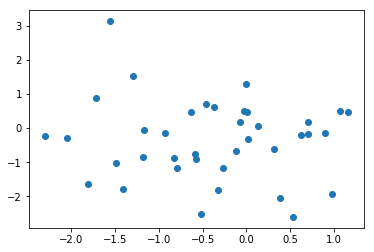

In [346]:
plt.scatter(Y[:,5], Y2[:, 5])

In [342]:
np.all(np.isclose(Y, Y2), 0)

array([ True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [330]:
%%time
K = 5
prior_activity = np.exp(-1*np.linspace(1, 1, K))
global_model = SpikeSlabSER(X2, Y, K, snp_ids2, tissues2, prior_activity, 20.0)
global_model.forward_fit(verbose=True, early_stop=True)

Forward fit, learning 1 components
Parameters converged at iter 3
Parameters converged at iter 0
Forward fit, learning 2 components
Parameters converged at iter 3
Parameters converged at iter 27
Forward fit, learning 3 components
Parameters converged at iter 2
Parameters converged at iter 36
Forward fit, learning 4 components
Parameters converged at iter 2
Parameters converged at iter 29
Forward fit, learning 5 components
Parameters converged at iter 3
Parameters converged at iter 55
CPU times: user 11.4 s, sys: 22.3 ms, total: 11.4 s
Wall time: 2.86 s


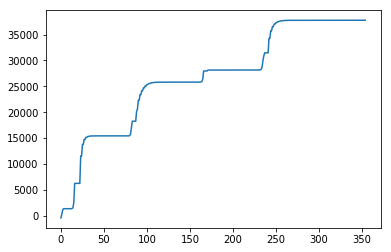

In [331]:
plt.plot(global_model.elbos)

In [320]:
Y.min()

-23.903697307480996

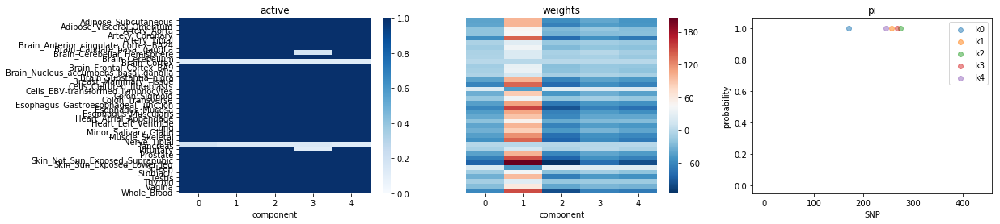

In [324]:
global_model.plot_components()

In [312]:
%%time
K = 5
prior_activity = np.exp(-1*np.linspace(2, 2, K))
tissue_model = SpikeSlabSER(X_tissue, Y, K, snp_ids, tissues, prior_activity, 20.0)
tissue_model.forward_fit()

Forward fit, learning 1 components
Forward fit, learning 2 components
Forward fit, learning 3 components
Forward fit, learning 4 components
Forward fit, learning 5 components
CPU times: user 2min 22s, sys: 210 ms, total: 2min 23s
Wall time: 35.8 s


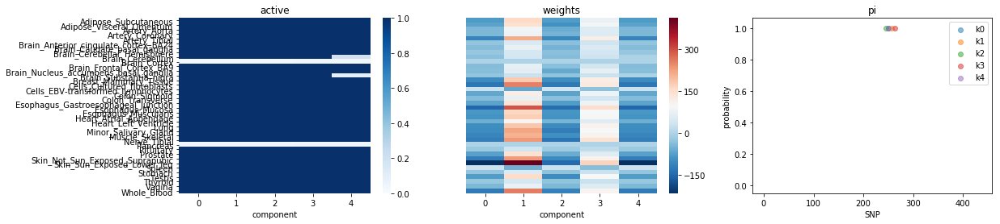

In [314]:
tissue_model.plot_components()

In [1043]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(1, 1, K))
ts_model = SpikeSlabSER(X_tissue, Y, K, snp_ids, tissues, prior_activity, 20.0)

ts_model.forward_fit(early_stop=True, verbose=True)

Forward fit, learning 1 components
Parameters converged at iter 3
Parameters converged at iter 0
Forward fit, learning 2 components
Parameters converged at iter 3
Parameters converged at iter 99
Forward fit, learning 3 components
Parameters converged at iter 3
Parameters converged at iter 113
Forward fit, learning 4 components
Parameters converged at iter 2
Parameters converged at iter 94
Forward fit, learning 5 components
Parameters converged at iter 2
Parameters converged at iter 137
Forward fit, learning 6 components
Parameters converged at iter 2
Parameters converged at iter 155
Forward fit, learning 7 components
Parameters converged at iter 2
Parameters converged at iter 247
Forward fit, learning 8 components
Parameters converged at iter 3
Parameters converged at iter 215
Forward fit, learning 9 components
Parameters converged at iter 3
Parameters converged at iter 325
Forward fit, learning 10 components
Parameters converged at iter 2
Forward fit, learning 11 components
Parameters

KeyboardInterrupt: 

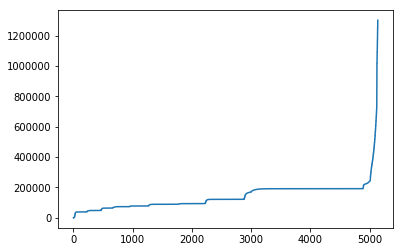

In [1045]:
#model.forward_fit(early_stop=True, verbose=True, max_inner_iter=1, diffuse=1.0)
plt.plot(ts_model.elbos)

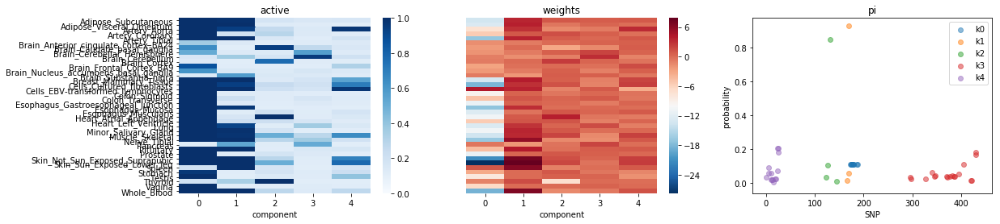

In [1046]:
model.plot_components()

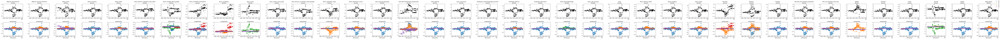

In [1047]:
model.plot_decomposed_zscores()

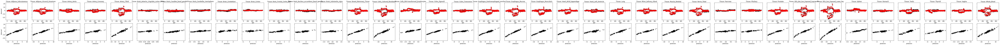

In [1049]:
model.plot_predictions()

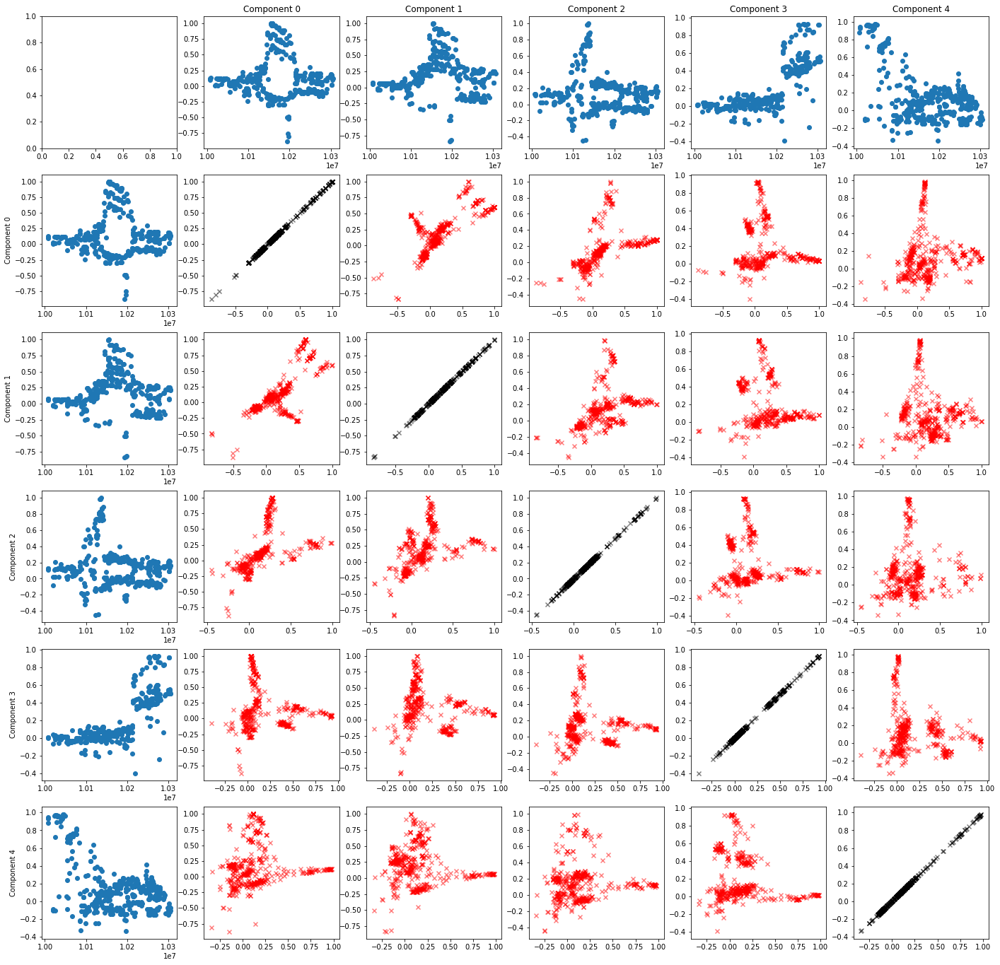

In [1050]:
model.plot_component_x_component()

In [662]:
%%time
model.update_pi()

CPU times: user 68 ms, sys: 1.12 ms, total: 69.1 ms
Wall time: 68.3 ms


0.9984215962139442

In [663]:
%%time
model.update_weights()

CPU times: user 269 ms, sys: 978 µs, total: 270 ms
Wall time: 71.7 ms


11.628004430954444

In [664]:
%%time
model.update_active()

CPU times: user 93.6 ms, sys: 1.05 ms, total: 94.7 ms
Wall time: 94.3 ms


0.9973655957978625

In [671]:
%%timeit
model._compute_residual()

3.07 ms ± 36.4 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [724]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(1, 1, K))
ts_model = SpikeSlabSER(X_tissue, Y, K, snp_ids, tissues, prior_activity, 20.0)

#model.forward_fit(early_stop=True, verbose=True, max_inner_iter=1, diffuse=1.0)
#plt.plot(model.elbos)

CPU times: user 396 µs, sys: 67 µs, total: 463 µs
Wall time: 334 µs


Forward fit, learning 1 components
Forward fit, learning 2 components
Forward fit, learning 3 components
Forward fit, learning 4 components
Forward fit, learning 5 components
Forward fit, learning 6 components
Forward fit, learning 7 components
Forward fit, learning 8 components
Forward fit, learning 9 components
Forward fit, learning 10 components
Forward fit, learning 11 components
Forward fit, learning 12 components
Forward fit, learning 13 components
Forward fit, learning 14 components
Forward fit, learning 15 components
Forward fit, learning 16 components
Forward fit, learning 17 components
Forward fit, learning 18 components
Forward fit, learning 19 components
Forward fit, learning 20 components


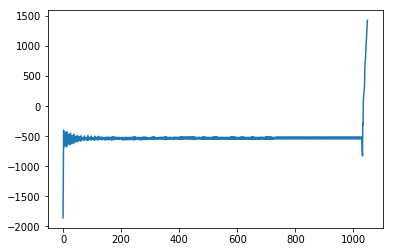

In [725]:
model.forward_fit(early_stop=True, verbose=True, max_inner_iter=1, diffuse=1.0)
plt.plot(model.elbos)

In [670]:
%%timeit
ts_model._compute_residual()

375 ms ± 7.76 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [658]:
%%time
model.update_pi()

CPU times: user 7.99 s, sys: 26.8 ms, total: 8.02 s
Wall time: 8.05 s


0.8625226689498382

In [659]:
%%time
model.update_weights()

CPU times: user 18.4 s, sys: 36 ms, total: 18.4 s
Wall time: 8.13 s


35.028417627173354

In [660]:
%%time
model.update_active()

CPU times: user 8.22 s, sys: 21.6 ms, total: 8.24 s
Wall time: 7.84 s


0.8876454493791539

Forward fit, learning 1 components


KeyboardInterrupt: 

In [641]:
Kzz = (model.pi.T @ model.X @ model.pi)

In [645]:
np.diag(Kzz, 0)

ValueError: Input must be 1- or 2-d.

In [558]:
model._fit()

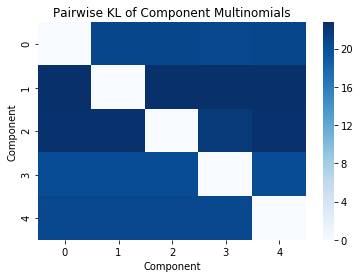

In [559]:
model.plot_assignment_kl()

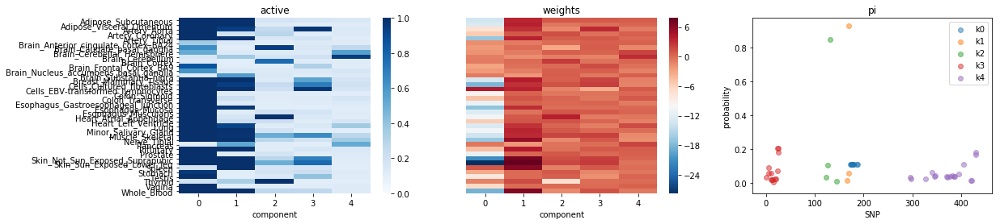

In [560]:
model.sort_components()
model.plot_components()

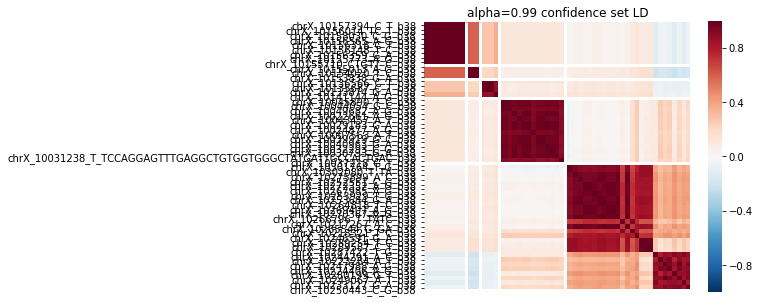

In [561]:
model.plot_credible_sets_ld(alpha=0.99)

In [537]:
cs = model.get_credible_sets(alpha=0.99)

In [562]:
afreq.set_index('ID').loc[cs[0]]

,Unnamed: 0,#CHROM,REF,ALT,ALT_FREQS,OBS_CT
ID,,,,,,
chrX_10157394_C_T_b38,45314458,X,C,T,0.233252,1642
chrX_10156014_TC_T_b38,45314438,X,TC,T,0.241566,1660
chrX_10158030_C_G_b38,45314461,X,C,G,0.225153,1630
chrX_10156565_A_G_b38,45314447,X,A,G,0.235187,1654
chrX_10156318_C_T_b38,45314445,X,C,T,0.236906,1642
chrX_10156148_T_C_b38,45314440,X,T,C,0.232034,1642
chrX_10156359_G_A_b38,45314446,X,G,A,0.242806,1668
chrX_10155773_A_G_b38,45314437,X,A,G,0.226380,1630
chrX_10155710_CTGTT_C_b38,45314436,X,CTGTT,C,0.239342,1642


In [563]:
afreq.set_index('ID').loc[cs[1]]

,Unnamed: 0,#CHROM,REF,ALT,ALT_FREQS,OBS_CT
ID,,,,,,
chrX_10155013_A_G_b38,45314431,X,A,G,0.472121,1650
chrX_10154020_T_C_b38,45314426,X,T,C,0.471014,1656
chrX_10153838_G_A_b38,45314422,X,G,A,0.471856,1670


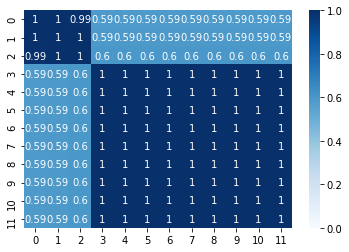

In [564]:
snps = np.isin(model.snp_ids, np.concatenate([cs[0], cs[1]]))
sns.heatmap(model.X[snps][:, snps], cmap='Blues', vmin=0, annot=True)

In [38]:
tissue_ld = {}
for tissue in model.tissue_ids:
    tissue_ld[tissue] = pd.read_csv(
        '../data/{}/{}_{}.ld'.format(gene, gene, tissue), sep='\t', header=None)

NameError: name 'model' is not defined

In [484]:
model

NameError: name 'model' is not defined

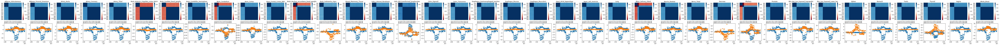

In [608]:
W = model.active * model.weights
c = (model.X @ model.pi)
pos = np.array([int(x.split('_')[1]) for x in model.snp_ids])

fig, ax = plt.subplots(2, model.tissue_ids.size, figsize=(model.tissue_ids.size *4, 6))
for i, tissue in enumerate(model.tissue_ids):
    sns.heatmap(tissue_ld[tissue].iloc[snps, snps], cmap='RdBu', vmin=-1, vmax=1, ax=ax[0, i])
    ax[0, i].set_title(tissue)
    for k in range(2):
        predk = W[i, k] * c[:, k]
        ax[1, i].scatter(pos, predk, marker='o', alpha=0.5, label='k{}'.format(k))

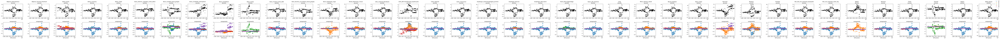

In [566]:
model.plot_decomposed_zscores()

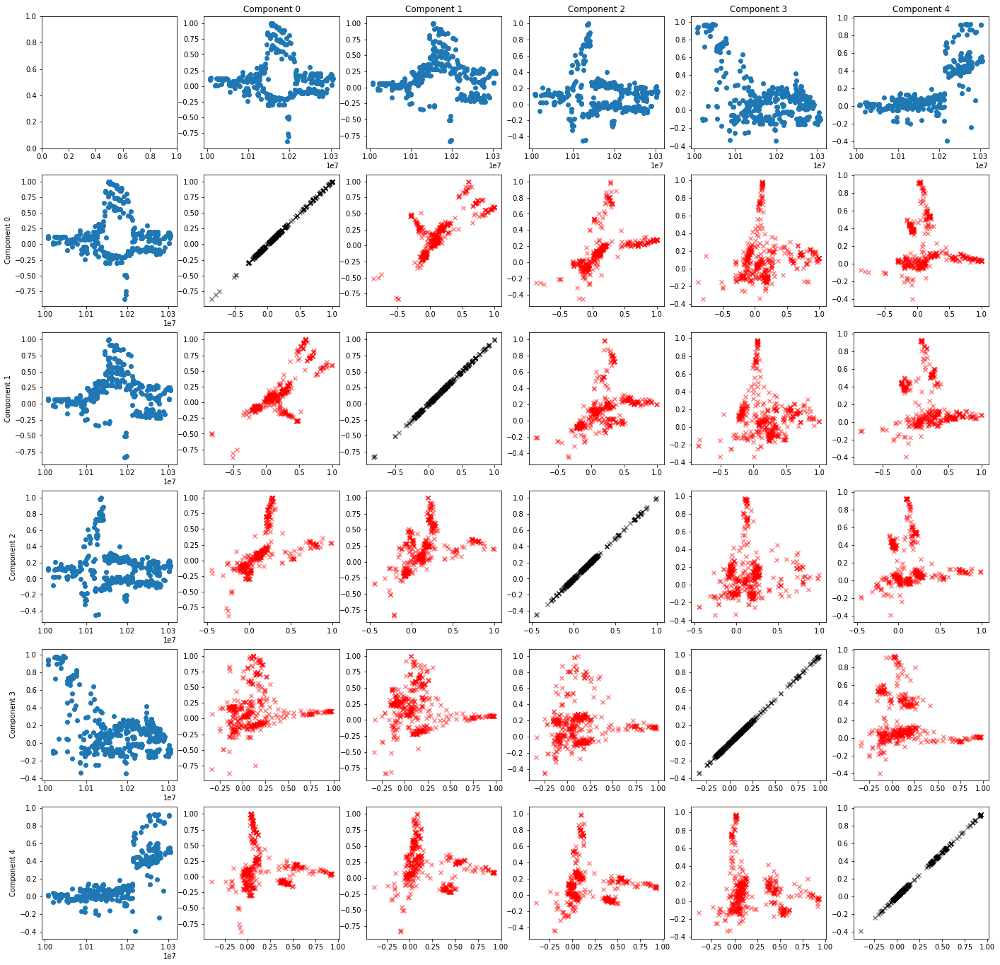

In [567]:
model.plot_component_x_component()

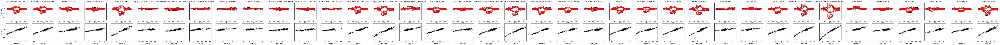

In [473]:
model.plot_predictions()

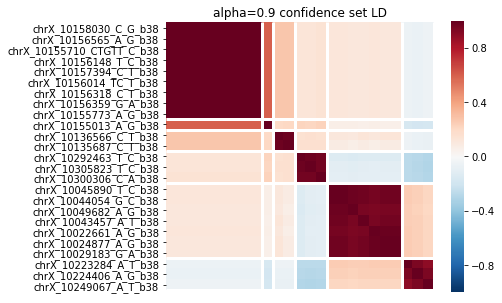

In [474]:
model.plot_credible_sets_ld()

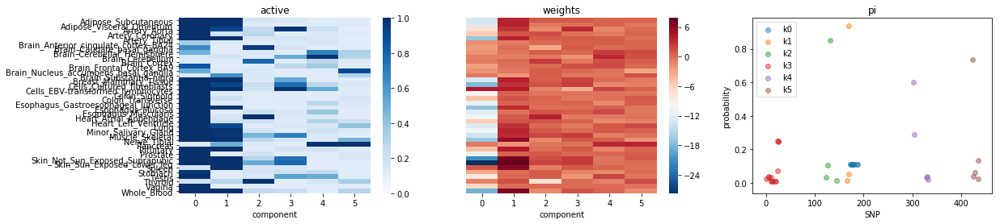

In [249]:
model.plot_components()

### Kmeans init

In [479]:
from sklearn.cluster import KMeans
from scipy.spatial import distance

In [480]:
km = KMeans(n_clusters=K).fit(model.X)
distance.cdist(model.X, km.cluster_centers_).max(axis=0)

array([12.79472957,  8.36480504, 14.513172  , 12.5587181 , 13.19235967,
       11.29525523, 13.80823268,  9.8154858 , 14.99980629,  9.49652741,
       11.18924198,  8.51930636, 15.02124863, 10.0018244 , 15.45976634,
       13.83974377, 10.38488041, 10.47410033, 10.4924253 , 10.53542936])

In [505]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(1, 1, K))
model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 20.0)

CPU times: user 358 µs, sys: 76 µs, total: 434 µs
Wall time: 314 µs


In [506]:
pi = np.square(1 / distance.cdist(model.X, km.cluster_centers_))
pi = pi / pi.sum(0)
model.pi = pi
model.weights = np.zeros_like(model.weights)
model.active = np.ones_like(model.active)

In [507]:
model._compute_residual(5)

array([[ 6.82725226e-01,  3.07995068e-01, -2.54925784e-01, ...,
         5.57605783e-01,  1.34313274e-01, -5.55581692e-02],
       [-1.32442314e+00, -1.79710963e+00, -1.30804703e+00, ...,
        -3.48445458e-02, -1.11576020e+00, -1.29017388e+00],
       [ 1.86671177e+00,  1.91844077e+00,  2.57235825e+00, ...,
         2.72713114e-01, -7.18508066e-01, -6.02256675e-01],
       ...,
       [ 1.75738172e-01,  1.79038182e-01, -3.92057659e-01, ...,
         1.11973339e+00,  8.89922452e-01,  5.66565186e-01],
       [-6.73600460e-01, -5.51300375e-01, -1.42180317e+00, ...,
        -3.42875406e-02, -1.01281613e+00, -1.02706891e+00],
       [ 2.48645643e-02, -4.58694640e-01,  3.17526171e-04, ...,
        -2.05978154e+00, -2.57358754e+00, -2.39801646e+00]])

Parameters converged at iter 51


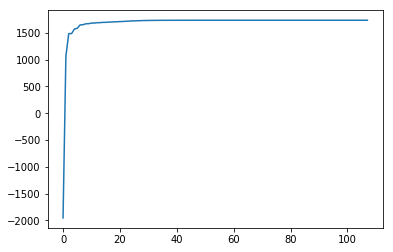

In [509]:
model._fit(bound=True, verbose=True, max_inner_iter=1, max_outer_iter=1000)
plt.plot(model.elbos)

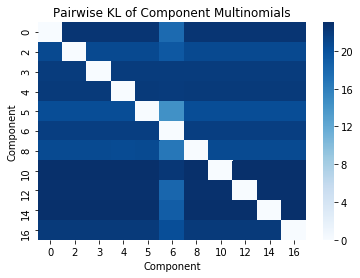

In [510]:
model.plot_assignment_kl()

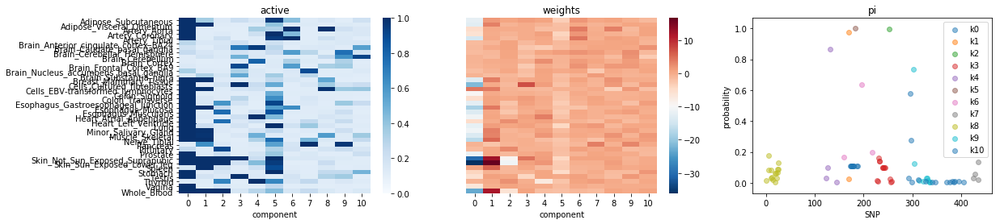

In [513]:
model.sort_components()
model.plot_components()

In [300]:
order = np.flip(np.argsort(model.weights.max(0)))
model.weights = model.weights[:, order]
model.active = model.active[:, order]
model.pi = model.pi[:, order]

kmeans_model = model

In [ ]:
m

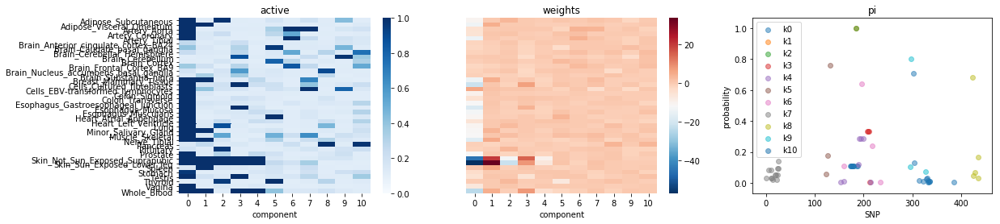

In [464]:
model.sort_components()
model.plot_components()

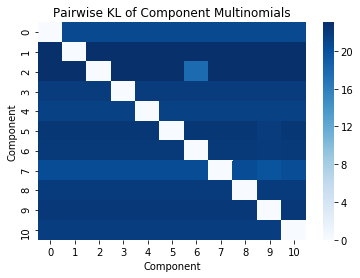

In [465]:
model.plot_assignment_kl()

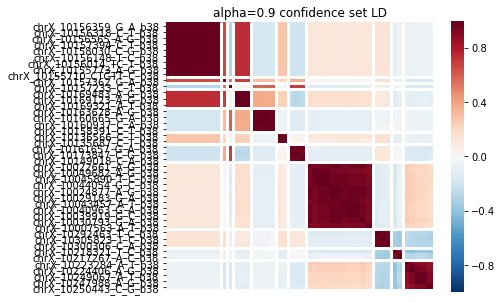

In [466]:
model.plot_credible_sets_ld()

### Diffuse pi to avoid local minima

In [453]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(1, 1, K))
model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 20.0)

CPU times: user 337 µs, sys: 136 µs, total: 473 µs
Wall time: 310 µs


In [454]:
pi = np.square(1 / distance.cdist(model.X, km.cluster_centers_))
pi = pi / pi.sum(0)
model.pi = pi
model.weights = np.zeros_like(model.weights)
model.active = np.ones_like(model.active)

Parameters converged at iter 20


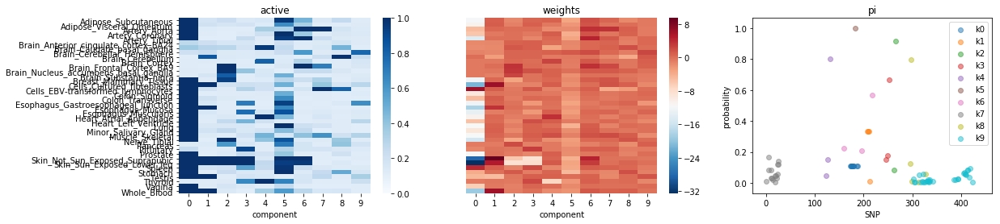

In [455]:
model._fit(bound=True, verbose=True, max_inner_iter=10)
model.sort_components()
model.plot_components()

Parameters converged at iter 0


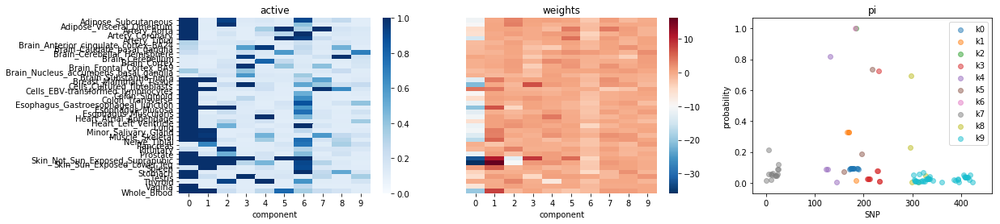

In [456]:
model.diffusion_fit(schedule=np.linspace(0.8, 0.99, 20))
model.sort_components()
model.plot_components()

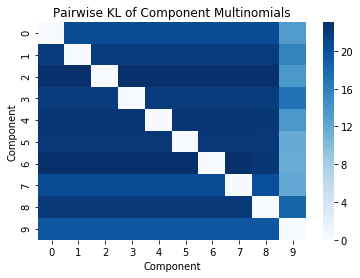

In [457]:
model.plot_assignment_kl()

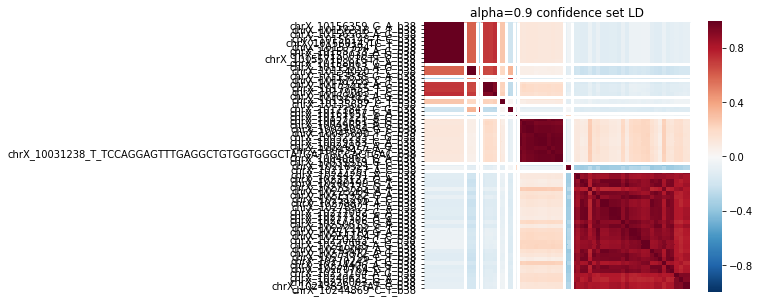

In [458]:
model.plot_credible_sets_ld()

Parameters converged at iter 66


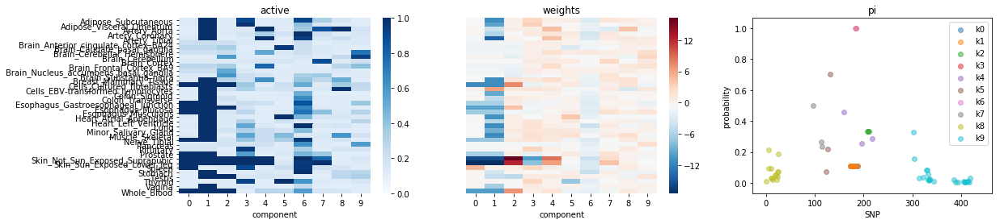

In [413]:
model._fit(verbose=True)
model.sort_components()
model.plot_components()

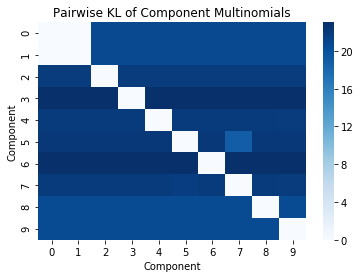

In [414]:
model.plot_assignment_kl()

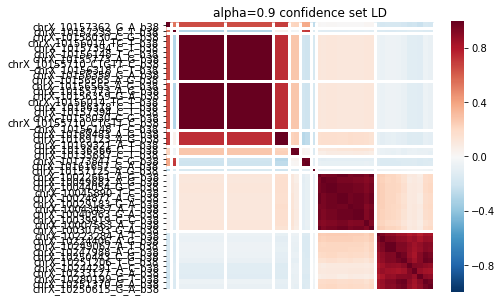

In [407]:
model.plot_credible_sets_ld()

### Forward fit, then diffuse

Forward fit, learning 1 components
Parameters converged at iter 2
Parameters converged at iter 0
Forward fit, learning 2 components
Parameters converged at iter 8
Parameters converged at iter 13
Forward fit, learning 3 components
Parameters converged at iter 5
Parameters converged at iter 6
Forward fit, learning 4 components
Parameters converged at iter 10
Parameters converged at iter 6
Forward fit, learning 5 components
Parameters converged at iter 23
Parameters converged at iter 11
Forward fit, learning 6 components
Parameters converged at iter 30
Parameters converged at iter 9
Forward fit, learning 7 components
Parameters converged at iter 17
Parameters converged at iter 7
learned inactive cluster, finalizing parameters
Parameters converged at iter 17


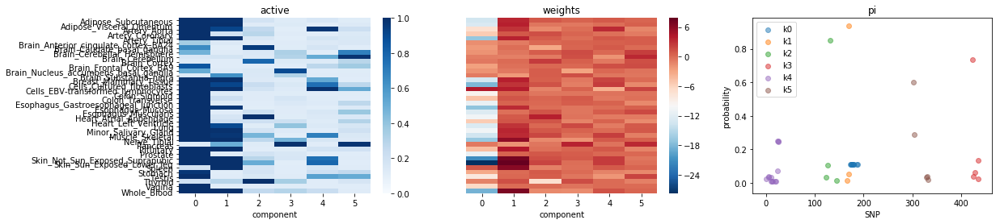

CPU times: user 38 s, sys: 114 ms, total: 38.2 s
Wall time: 9.97 s


In [475]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(1, 1, K))
#prior_activity = np.exp(-1*np.linspace(0.7, 0.7, K))

model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 20.0)

model.forward_fit(early_stop=True, verbose=True, max_inner_iter=1)
model.sort_components()
model.plot_components()

Parameters converged at iter 0


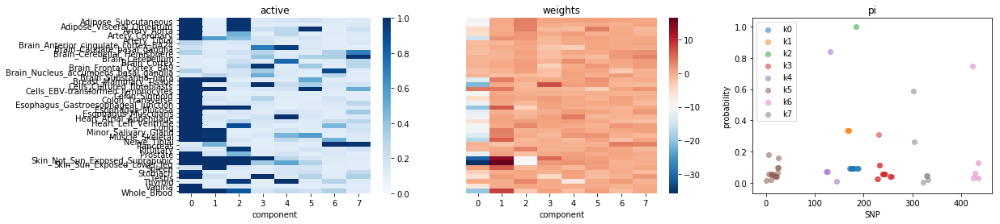

In [476]:
model.diffusion_fit(schedule=np.linspace(0.5, 0.99, 20))
model.sort_components()
model.plot_components()

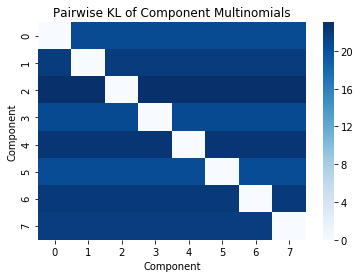

In [477]:
model.plot_assignment_kl()

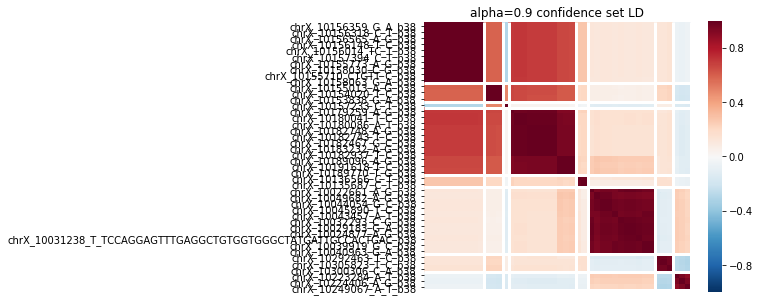

In [478]:
model.plot_credible_sets_ld()

Parameters converged at iter 42


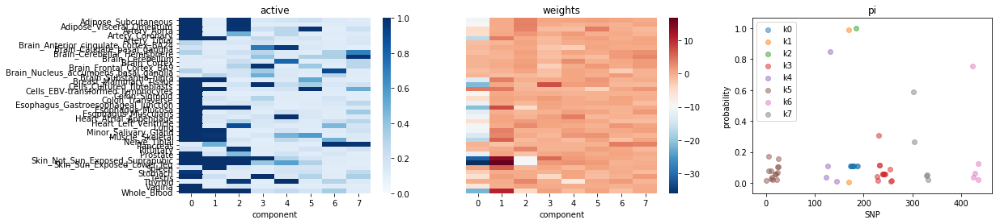

In [443]:
model._fit(verbose=True)
model.sort_components()
model.plot_components()

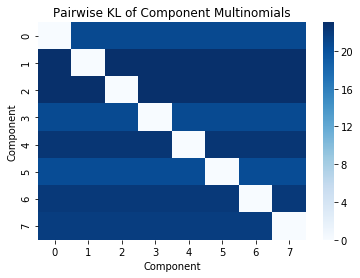

In [444]:
model.plot_assignment_kl()

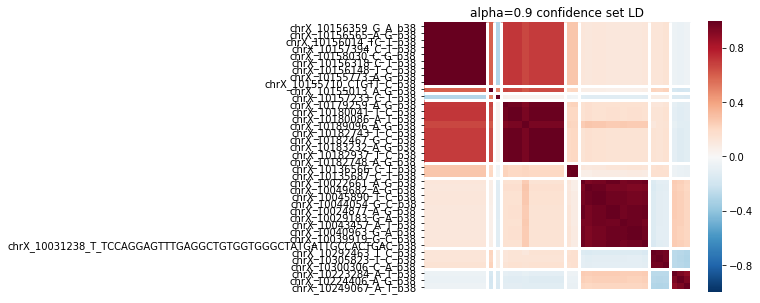

In [438]:
model.plot_credible_sets_ld()

In [311]:
from spike_and_slab_ser import categorical_kl

big_pi = np.hstack([forward_fit_pi, kmeans_pi])
KL = np.eye(K)
for i in range(K):
    for j in range(K):
        KL[i, j] = categorical_kl(forward_fit_pi[:, i], kmeans_pi[:, j])

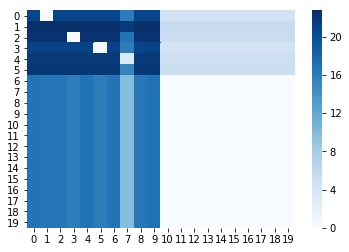

In [312]:
sns.heatmap(KL, cmap='Blues')

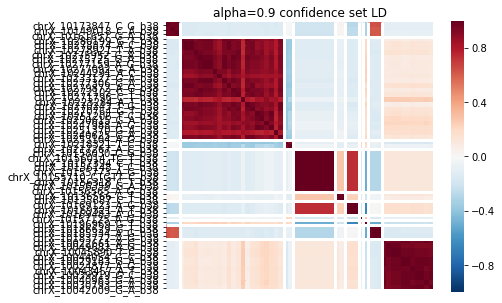

In [286]:
model.plot_credible_sets_ld()

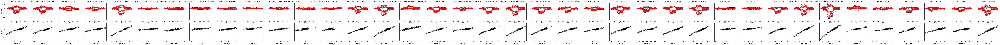

In [271]:
model.plot_predictions()

In [238]:
model.plot_component_manhattan()

AttributeError: 'SpikeSlabSER' object has no attribute 'plot_component_manhattan'

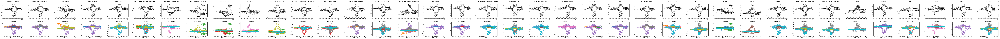

In [239]:
model.plot_decomposed_zscores()

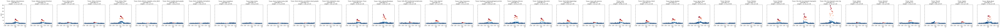

In [993]:
model.plot_manhattan(0)

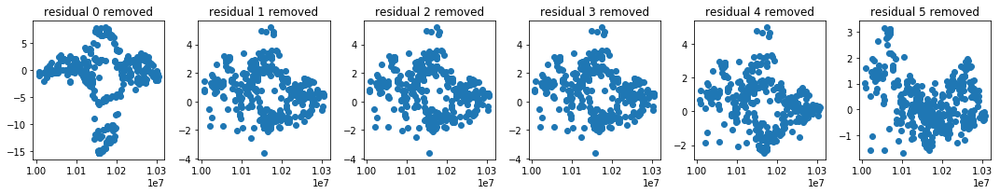

In [995]:
model.plot_residual_zscores('Artery_Tibial', 5)

Parameters converged at iter 58
CPU times: user 16.7 s, sys: 35.6 ms, total: 16.8 s
Wall time: 4.2 s


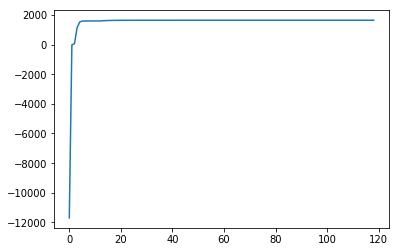

In [967]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(3, 3, K))
model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 10.0)
model._fit(bound=True, max_outer_iter=100, verbose=True)
plt.plot(model.elbos)

CPU times: user 449 ms, sys: 2.45 ms, total: 452 ms
Wall time: 116 ms


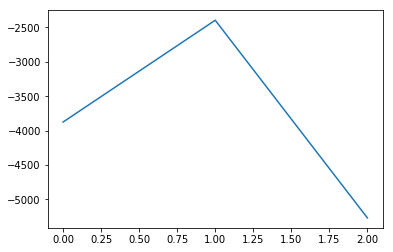

In [907]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(3, 3, K))
model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 10.0)

elbos = []
for _ in range(1):
    model.update_pi()
    elbos.append(model.compute_elbo())

    model.update_weights()
    elbos.append(model.compute_elbo())

    u = model.update_active()
    elbos.append(model.compute_elbo())

plt.plot(elbos)

In [916]:
model.active.shape

(38, 20)

CPU times: user 3.73 s, sys: 8.59 ms, total: 3.74 s
Wall time: 938 ms


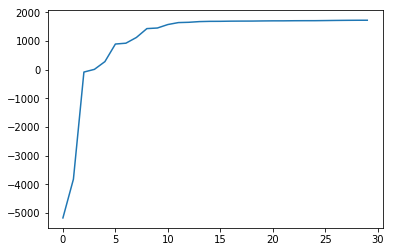

In [966]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(3, 3, K))
model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 1000.0)

elbos_old = []
elbos = []
for _ in range(10):
    model.update_pi()
    elbos.append(model.compute_elbo())
    
    model.update_weights()
    elbos.append(model.compute_elbo())

    model.update_active()
    elbos.append(model.compute_elbo())

plt.plot(elbos)
#plt.plot(elbos_old)

CPU times: user 3.86 s, sys: 9.02 ms, total: 3.87 s
Wall time: 973 ms


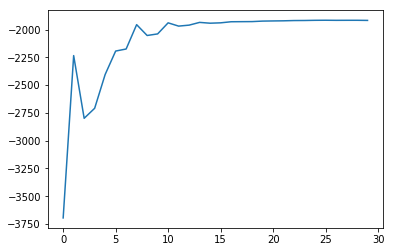

In [953]:
%%time
K = 20
prior_activity = np.exp(-1*np.linspace(3, 3, K))
model = SpikeSlabSER(X, Y, K, snp_ids, tissues, prior_activity, 10.0)

elbos = []
for _ in range(10):
    model.update_pi()
    elbos.append(model.compute_elbo())

    model.update_weights()
    elbos.append(model.compute_elbo())

    u = model.update_active()
    elbos.append(model.compute_elbo())

plt.plot(elbos)

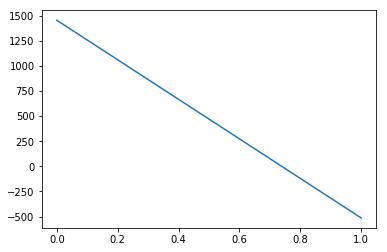

In [952]:
plt.plot((np.roll(elbos, -1) - elbos)[:-1])

Forward fit, learning 1 components
Parameters converged at iter 3
Parameters converged at iter 0


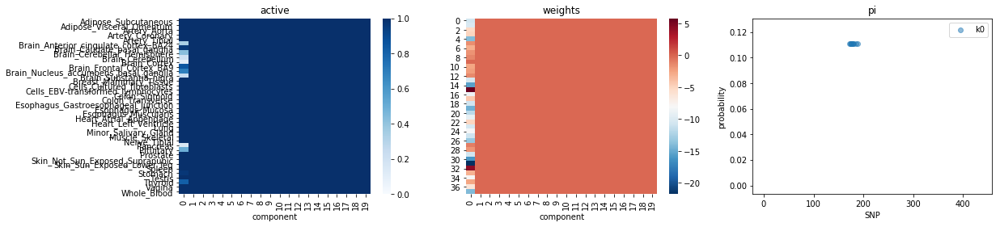

Forward fit, learning 2 components
Parameters converged at iter 9
Parameters converged at iter 12


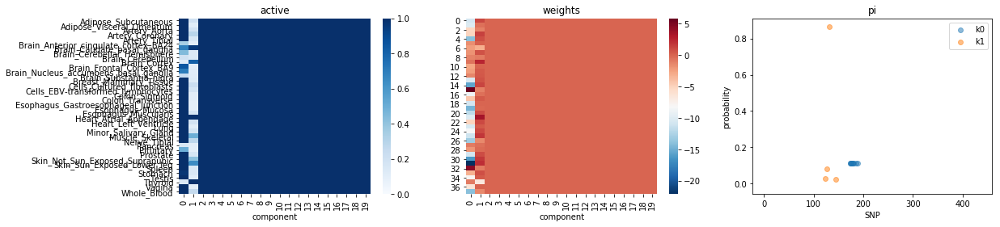

Forward fit, learning 3 components
Parameters converged at iter 11
Parameters converged at iter 34


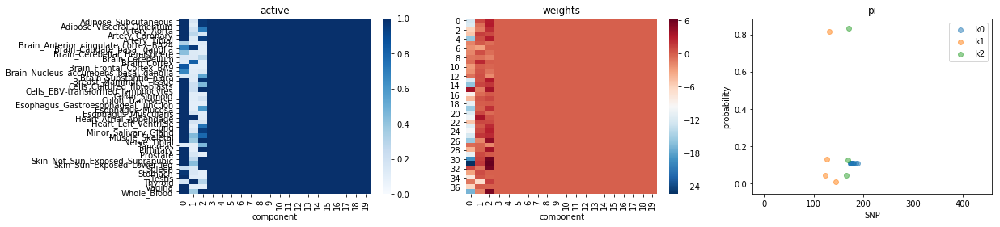

Forward fit, learning 4 components
Parameters converged at iter 4
Parameters converged at iter 34


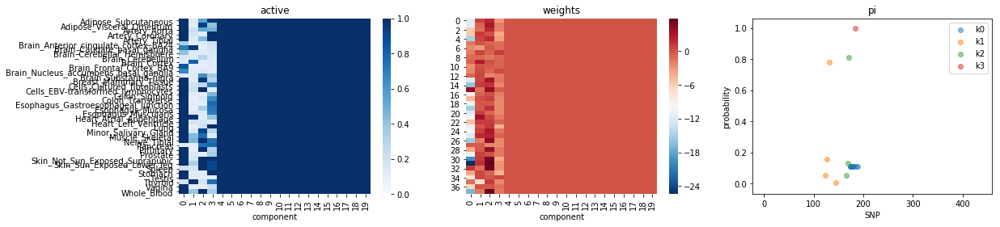

Forward fit, learning 5 components
Parameters converged at iter 13
Parameters converged at iter 98


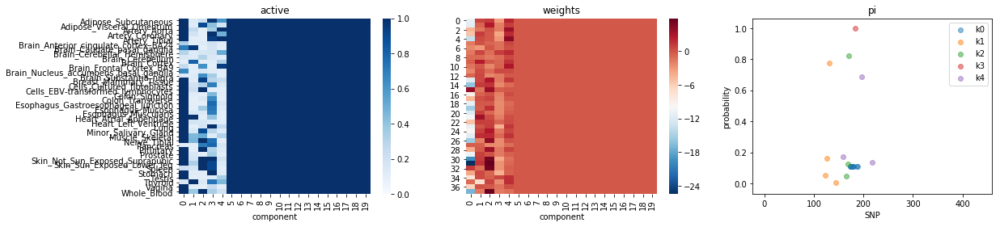

Forward fit, learning 6 components
Parameters converged at iter 18
Parameters converged at iter 53


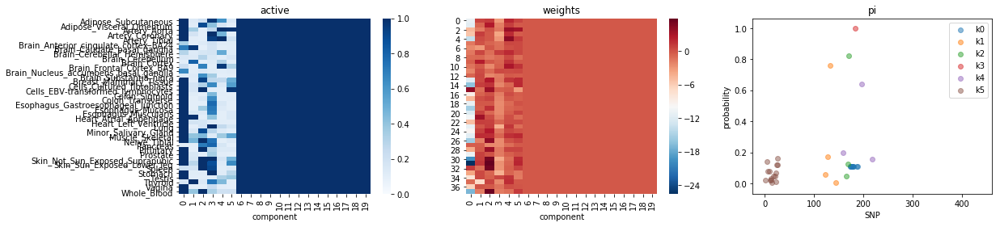

Forward fit, learning 7 components
Parameters converged at iter 13
Parameters converged at iter 62


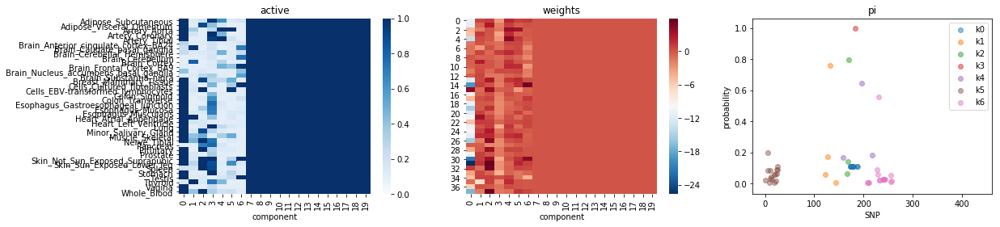

Forward fit, learning 8 components
Parameters converged at iter 13
Parameters converged at iter 27


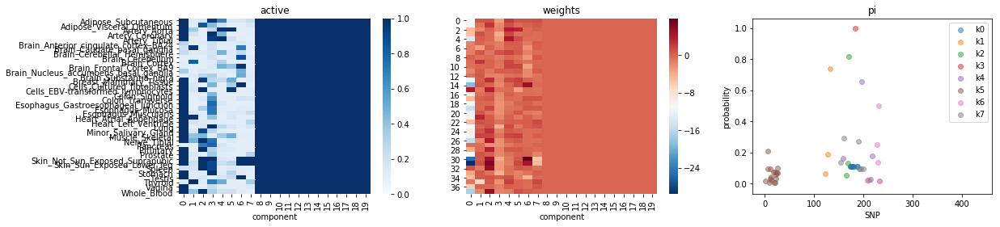

Forward fit, learning 9 components
Parameters converged at iter 40
Parameters converged at iter 78


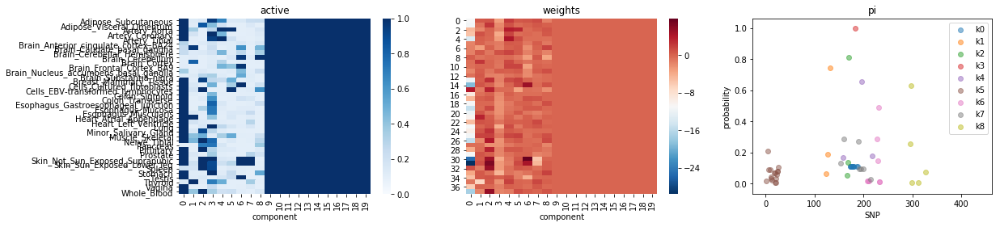

Forward fit, learning 10 components
Parameters converged at iter 27
Parameters converged at iter 53


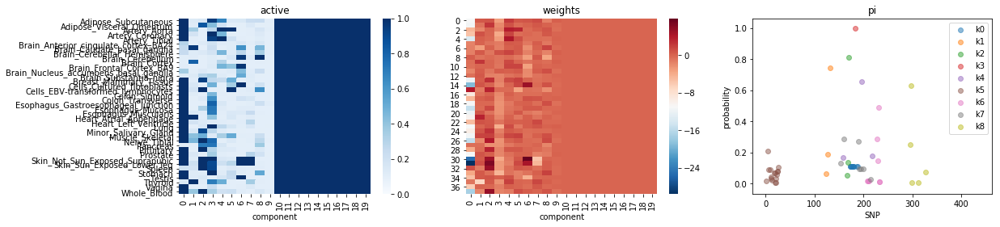

learned inactive cluster, finalizing parameters
Parameters converged at iter 80


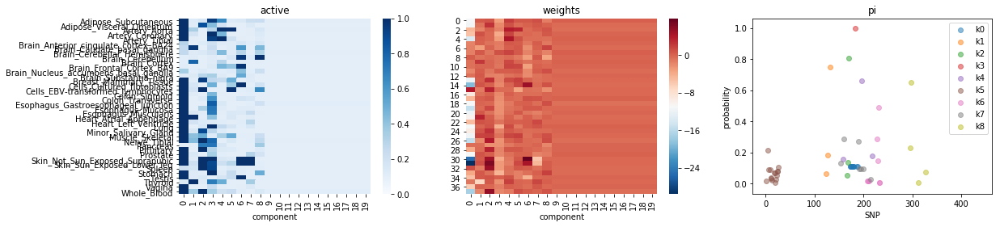

In [814]:
model.weights = np.zeros_like(model.weights)
model.active = np.ones_like(model.active)

model.forward_fit(early_stop=True, verbose=True, restarts=1, plots=True)
#model._fit(verbose=True, bound=True, max_outer_iter=200)

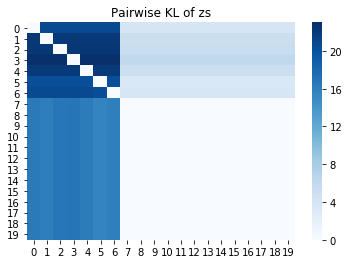

In [739]:
model.plot_assignment_kl()

In [740]:
model.weights.min()

-25.42631536205172

In [741]:
model.weights.max()

5.962199945355597

In [742]:
model

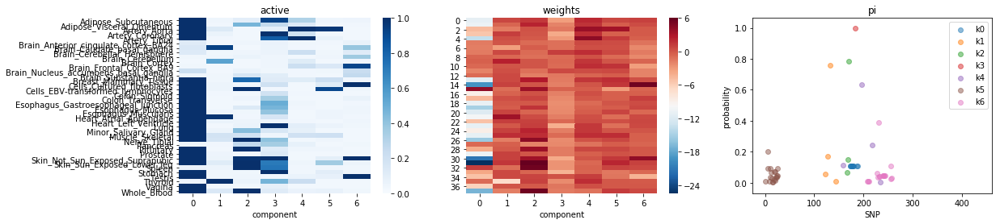

In [743]:
model.plot_components()

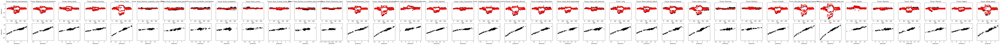

In [744]:
model.plot_predictions()

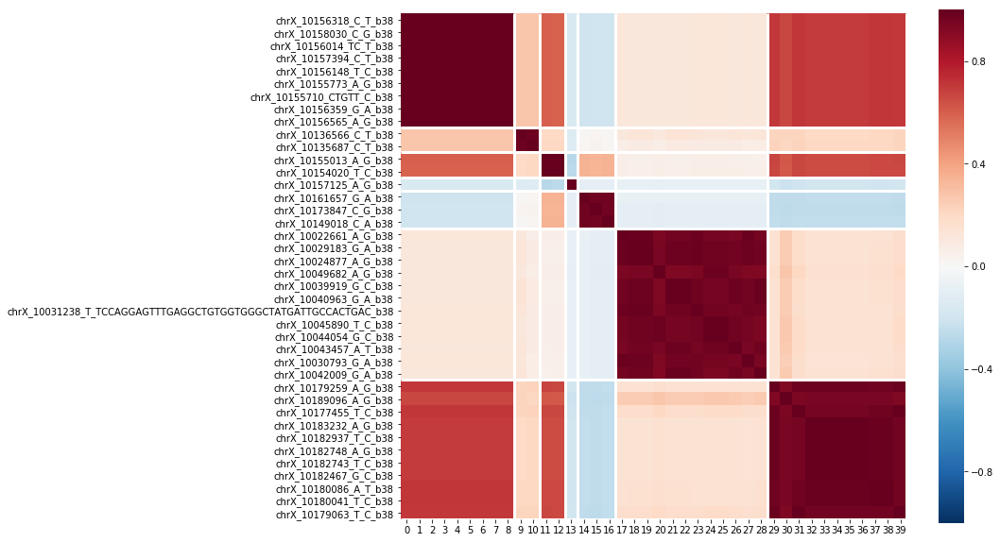

In [745]:
model.plot_confidence_sets_ld()

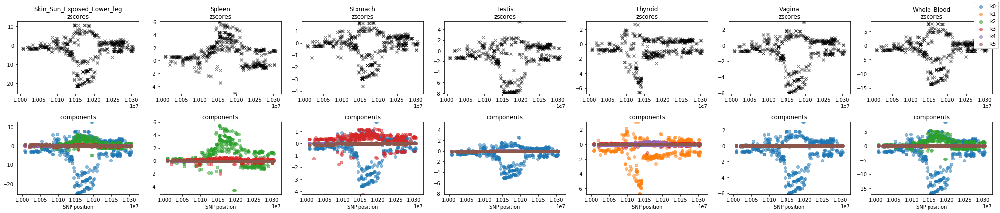

In [644]:
model.plot_decomposed_zscores(tissues=model.tissue_ids[-7:], components=np.arange(6))

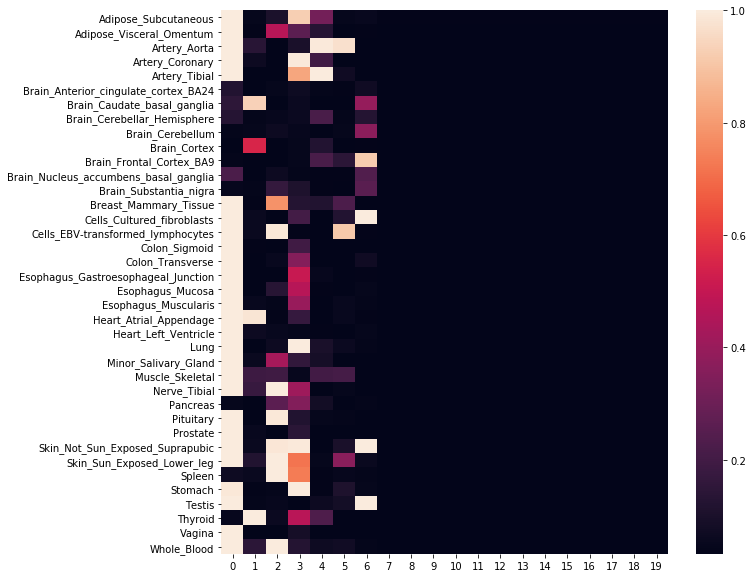

In [653]:
fig, ax = plt.subplots(1,1,  figsize=(10, 10))
sns.heatmap(model.active, yticklabels=model.tissue_ids)

In [647]:
model.get_A_in_B_coloc()

,Adipose_Subcutaneous,Adipose_Visceral_Omentum,Artery_Aorta,Artery_Coronary,Artery_Tibial,Brain_Anterior_cingulate_cortex_BA24,Brain_Caudate_basal_ganglia,Brain_Cerebellar_Hemisphere,Brain_Cerebellum,Brain_Cortex,...,Pituitary,Prostate,Skin_Not_Sun_Exposed_Suprapubic,Skin_Sun_Exposed_Lower_leg,Spleen,Stomach,Testis,Thyroid,Vagina,Whole_Blood
Adipose_Subcutaneous,1.000000,0.116463,0.083772,0.360223,0.409075,0.005601,0.006914,0.006245,0.001705,0.001433,...,0.068086,0.068520,0.392595,0.282953,0.019166,0.336145,0.037890,0.010046,0.051880,0.072151
Adipose_Visceral_Omentum,0.308325,1.000000,0.257260,0.290488,0.310318,0.026453,0.033044,0.029154,0.009108,0.007656,...,0.398758,0.220318,0.537138,0.490421,0.033011,0.283846,0.224692,0.013625,0.215997,0.406591
Artery_Aorta,0.012420,0.004015,1.000000,0.006585,0.051347,0.000176,0.000200,0.000954,0.000055,0.000132,...,0.001718,0.001141,0.002505,0.009886,0.000114,0.003063,0.003587,0.000410,0.001120,0.003861
Artery_Coronary,0.454030,0.125977,0.060806,1.000000,0.466512,0.004092,0.004938,0.004212,0.001085,0.000857,...,0.057913,0.066496,0.484412,0.345500,0.023549,0.452944,0.019176,0.012362,0.042408,0.062317
Artery_Tibial,0.166020,0.028472,0.150421,0.108510,1.000000,0.000654,0.000686,0.003571,0.000168,0.000491,...,0.006994,0.005570,0.019334,0.020096,0.001160,0.022087,0.007296,0.003801,0.004775,0.011102
Brain_Anterior_cingulate_cortex_BA24,0.535889,0.514638,0.538137,0.531859,0.544854,1.000000,0.469746,0.449899,0.448868,0.445752,...,0.519883,0.497826,0.594681,0.551931,0.482223,0.530273,0.532234,0.469598,0.495356,0.524697
Brain_Caudate_basal_ganglia,0.040311,0.035725,0.069585,0.045875,0.036495,0.029060,1.000000,0.032744,0.037668,0.170305,...,0.033781,0.039707,0.071629,0.066272,0.038131,0.037235,0.057360,0.302067,0.032521,0.071347
Brain_Cerebellar_Hemisphere,0.427696,0.395508,0.494469,0.412475,0.496854,0.331945,0.360883,1.000000,0.341223,0.340127,...,0.392607,0.373805,0.471302,0.416494,0.359188,0.396873,0.426051,0.367833,0.372035,0.399268
Brain_Cerebellum,0.362053,0.351711,0.365660,0.355165,0.362724,0.331691,0.408679,0.344276,1.000000,0.332400,...,0.359053,0.337824,0.588120,0.382944,0.358848,0.357363,0.526078,0.347439,0.336376,0.364661
Brain_Cortex,0.255042,0.241403,0.302382,0.255789,0.271620,0.224624,0.470851,0.233056,0.229404,1.000000,...,0.239521,0.237891,0.266427,0.274559,0.245573,0.244132,0.243639,0.501886,0.231137,0.273148


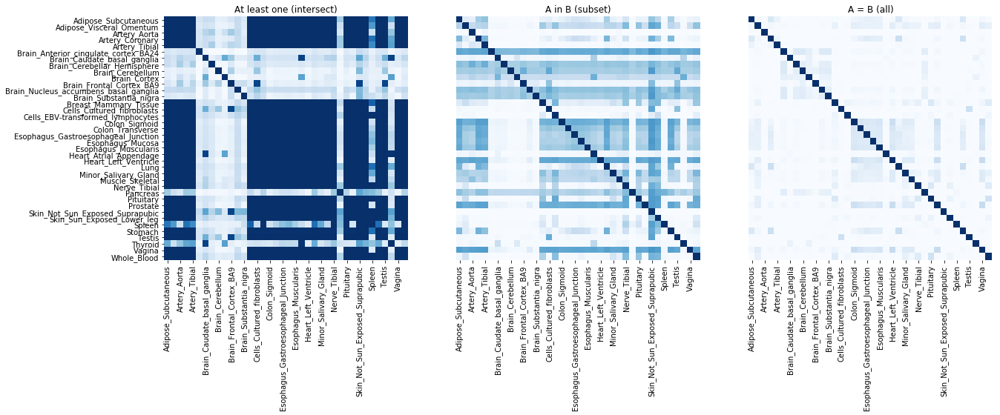

In [657]:
model.plot_colocalizations()

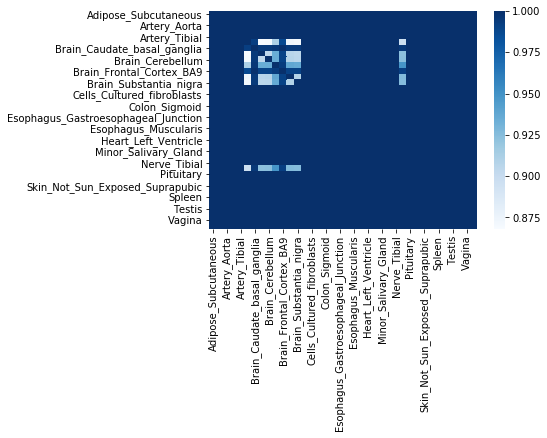

In [546]:
sns.heatmap(model.get_A_intersect_B_coloc(), cmap='Blues')

sns.heatmap(model.get_A_equals_B_coloc(), cmap='Blues')

sns.heatmap(model.get_A_in_B_coloc(), cmap='Blues')

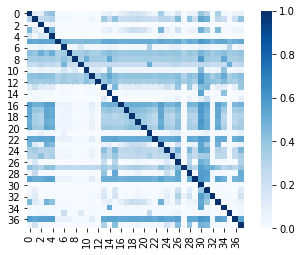

In [501]:
# A in B
probs = np.zeros((T, T))
for t1 in range(T):
    for t2 in range(T):
        A = model.active[t1]
        B  = model.active[t2]
        # 1 - p(component OFF in t2 and component ON in t1)
        probs[t1, t2] = np.exp(np.sum(np.log((1 - (1-B) * A) + 1e-10)))
    probs += np.eye(T) - np.diag(np.diag(probs))
    
sns.heatmap(probs, cmap='Blues', square=True)

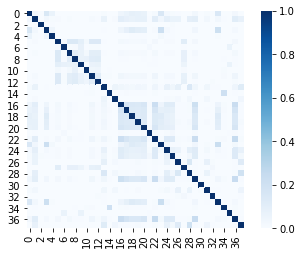

In [505]:
# A = B
probs = np.zeros((T, T))
for t1 in range(T):
    for t2 in range(T):
        A = model.active[t1]
        B  = model.active[t2]
        # prod(p(component on in both tissues) +p(component off in both tissues))
        probs[t1, t2] = np.exp(np.sum(np.log(A * B + (1- A)*(1-B) + 1e-10)))
    probs += np.eye(T) - np.diag(np.diag(probs))
    
sns.heatmap(probs, cmap='Blues', square=True)

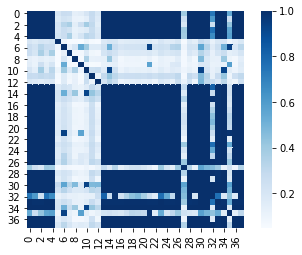

In [655]:
# A n B != 0
probs = np.zeros((T, T))
for t1 in range(T):
    for t2 in range(T):
        A = model.active[t1]
        B  = model.active[t2]
        # 1 - p(all components off in both tissues)
        probs[t1, t2] = 1 - np.exp(np.sum(np.log((1 - A * B) + 1e-10)))
    probs += np.eye(T) - np.diag(np.diag(probs))
    
sns.heatmap(probs, cmap='Blues', square=True)

In [355]:
1 - np.exp(np.sum(np.log((1 - A)*(1 - B) + 1e-10)))

0.9999999999999976

In [343]:
(1- A)*(1-B)

array([0.00000000e+00, 9.74129995e-01, 5.88544580e-04, 5.25077000e-02,
       9.89181278e-01, 9.30938919e-01, 9.91372227e-01, 9.91372290e-01,
       9.91372353e-01, 9.91372416e-01, 9.91372479e-01, 9.91372541e-01,
       9.91372604e-01, 9.91372667e-01, 9.91372729e-01, 9.91372792e-01,
       9.91372854e-01, 9.91372917e-01, 9.91372979e-01, 9.91373042e-01])

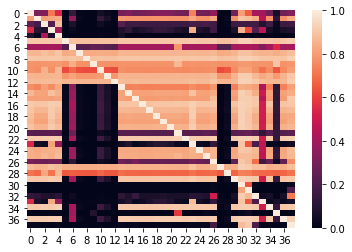

In [341]:
sns.heatmap(probs)

In [13]:
model.get_confidence_sets(0.3, thresh=0.5)

{0: array(['chrX_10156148_T_C_b38', 'chrX_10158030_C_G_b38',
        'chrX_10155710_CTGTT_C_b38'], dtype=object),
 1: array(['chrX_10136566_C_T_b38'], dtype=object),
 2: array(['chrX_10161657_G_A_b38'], dtype=object),
 3: array(['chrX_10155013_A_G_b38'], dtype=object),
 4: array(['chrX_10156014_TC_T_b38', 'chrX_10155773_A_G_b38',
        'chrX_10157394_C_T_b38', 'chrX_10156359_G_A_b38'], dtype=object),
 5: array(['chrX_10157125_A_G_b38'], dtype=object),
 6: array(['chrX_10022661_A_G_b38', 'chrX_10049682_A_G_b38',
        'chrX_10024877_A_G_b38'], dtype=object)}

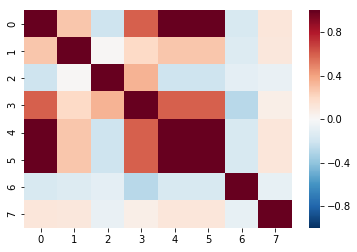

In [14]:
model.plot_confidence_sets_ld(alpha=0.1, thresh=0.3)

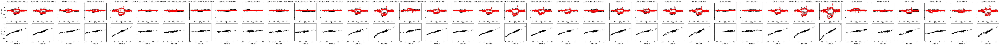

In [15]:
model.plot_predictions()

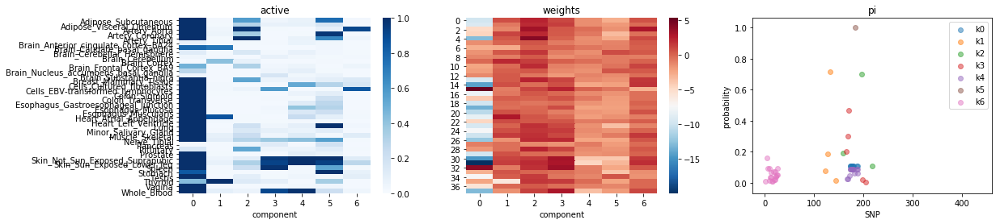

In [16]:
model.plot_components()

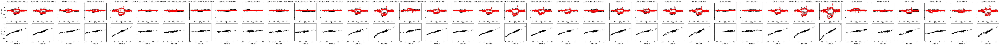

In [92]:
model.plot_predictions()

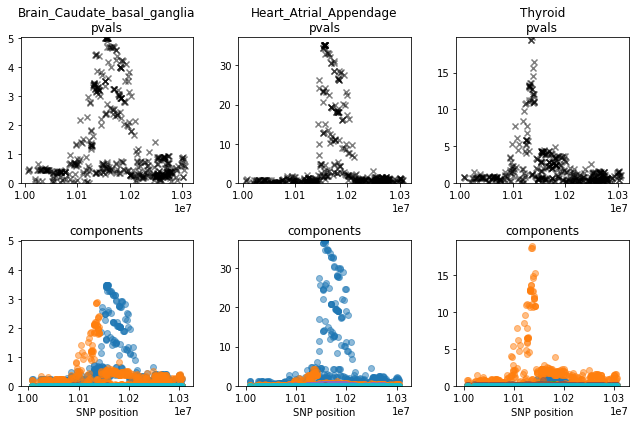

In [127]:
model.plot_decomposed_manhattan(model.tissue_ids[model.active[:, 1] > 0.5])

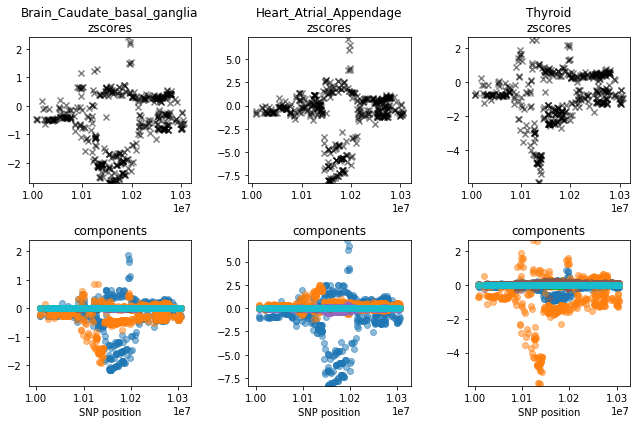

In [128]:
model.plot_decomposed_zscores(model.tissue_ids[model.active[:, 1] > 0.5])

In [73]:
tissue = 0
pred = ((model.active * model.weights) @ (model.X @ model.pi).T)
logp = -np.log(norm.cdf(-np.abs(pred))*2)

In [74]:
predk = ((model.active * model.weights)[tissue, k] * (model.X @ model.pi))
predk.shape

(437, 20)

In [80]:
W.shape, c.shape

((38, 20), (437, 20))

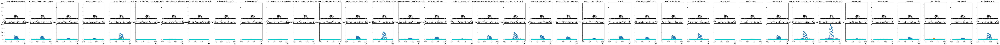

In [93]:
fig, ax = plt.subplots(2, T, figsize=((T)*4, 6), sharey=True)

pred = ((model.active * model.weights) @ (model.X @ model.pi).T)
logp = -np.log(norm.cdf(-np.abs(pred))*2)

W = model.active * model.weights
c = (model.X @ model.pi)

pred = W @ c.T
logp = -np.log(norm.cdf(-np.abs(pred))*2)

for t in range(T):
    ax[0, t].set_title('{} pvals'.format(model.tissue_ids[t]))
    ax[1, t].set_title('{} components'.format(model.tissue_ids[t]))

    ax[0, t].scatter(pos, logp[tissue], marker='x', c='k', alpha=0.5)
    for k in range(K):
        predk = W[t, k] * c[:, k]
        logpk = -np.log(norm.cdf(-np.abs(predk))*2)
        ax[1, t].scatter(pos, logpk, marker='o', alpha=0.5, label='{}'.format(k))

In [78]:
c * model

(437, 20)

In [18]:
sns.heatmap(np.stack([np.outer(p[:, k], p[:, k]) for k in range(model.K)])[0])

NameError: name 'p' is not defined

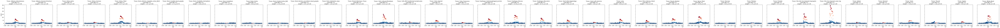

In [19]:
model.plot_manhattan(component=0, thresh=0.0)

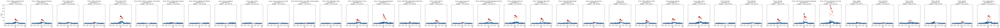

In [198]:
model.plot_manhattan(component=1, thresh=0.0)

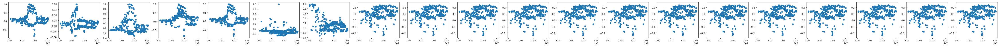

In [20]:
c = (model.X @ model.pi)
pos = np.array([int(x.split('_')[1]) for x in model.snp_ids])

fig, ax = plt.subplots(1, K, figsize=(K*4, 3))
for k in range(K):
    ax[k].scatter(pos, c[:, k])

In [24]:
from scipy.stats import norm

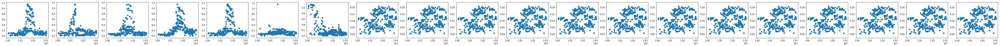

In [31]:
model.plot_component_manhattan()

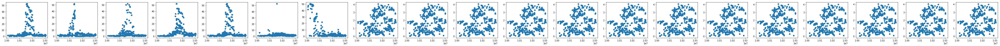

In [32]:
model.plot_component_manhattan(10)

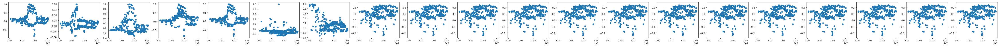

In [27]:
c = (model.X @ model.pi)
logp = -np.log(norm.cdf(-np.abs(5 * c))*2)
pos = np.array([int(x.split('_')[1]) for x in model.snp_ids])

fig, ax = plt.subplots(1, K, figsize=(K*4, 3))
for k in range(K):
    ax[k].scatter(pos, c[:, k])

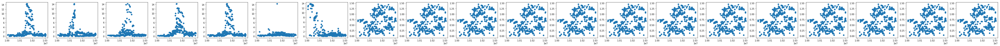

In [28]:
fig, ax = plt.subplots(1, K, figsize=(K*4, 3))
for k in range(K):
    ax[k].scatter(pos, logp[:, k])

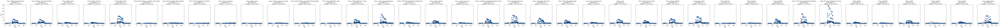

In [28]:
model.plot_manhattan(component=1, thresh=0.0)

In [189]:
model.pi.shape

(437, 20)

In [ ]:
model.plot_manhattan(component=4, thresh=0.3)

In [ ]:
plt.plot(model.elbos)

In [ ]:
model.weights.shape, np.isnan(model.Y).shape

In [ ]:
model.plot_manhattan(component=3, thresh=0.5)

In [ ]:
model.get_component_colocalization(0)

In [ ]:
model.get_global_colocalzation()